In [2]:
import sys

sys.executable


'c:\\Users\\Usuario\\Desktop\\Data Analytics - Cursos\\Advance Data-Analytics\\Google Advance DA\\Curso_Regresion\\env\\Scripts\\python.exe'

# Usando K-means para compresión de color


Tenga en cuenta que este cuaderno está destinado como un ejemplo demostrativo de cómo funciona el algoritmo K-means. Su enfoque está en la teoría y los resultados de su aplicación, no en el código en sí (que aprenderá más adelante). Como tal, difiere de otros cuadernos que acompañan las lecciones en video.

Específicamente, algunos de los pasos en el código exceden el alcance de lo que se enseña en las lecciones. **Preste atención a la salida de las celdas, y no tanto al código que la genera.**

Este laboratorio:

  * Le dará un ejemplo práctico de K-means en datos no sintéticos
  * Reforzará su comprensión de la teoría subyacente de K-means demostrando su efecto cuando se aplica a una fotografía


Antes de comenzar con este ejercicio de programación, recomendamos encarecidamente ver la conferencia en video y completar la IVQ para los temas asociados.


A medida que avanzamos, puedes encontrar instrucciones sobre cómo instalar las bibliotecas requeridas a medida que surjan en este cuaderno.


## Objetivo del modelado

Usaremos K-means para agrupar los píxeles de una fotografía de algunos tulipanes basándonos en sus valores de color codificados. Exploraremos cómo diferentes valores de _k_ afectan la agrupación de los píxeles, y por lo tanto, la apariencia de la fotografía. También examinaremos qué está sucediendo "bajo el capó" mientras el algoritmo se ejecuta.

**NOTA: Este cuaderno contiene gráficos interactivos que deben generarse cada vez que se abre el cuaderno. Para asegurar que los gráficos se muestren, navega a "Kernel" en el menú en la parte superior del cuaderno y haz clic en "Restart & Run All" en el menú desplegable.**


## Declaraciones de importación

Usaremos numpy y pandas para operaciones, y Plotly para visualización en 3D. De particular interés es `Kmeans`, que es la implementación del algoritmo K-means de scikit-learn.


In [ ]:
import numpy as np
import pandas as pd

# %pylab inline

%matplotlib inline

import plotly.graph_objects as go

from sklearn.cluster import KMeans

In [2]:
import plotly.io as pio
pio.renderers.default = 'notebook'

## Leer datos

Los "datos" en este caso no son un dataframe de pandas. Es una fotografía, que convertiremos en un arreglo numérico.


In [3]:
import matplotlib.pyplot as plt

In [4]:
# Read in a photo
img = plt.imread('using_kmeans_for_color_compression_tulips_photo.jpg')

(320, 240, 3)


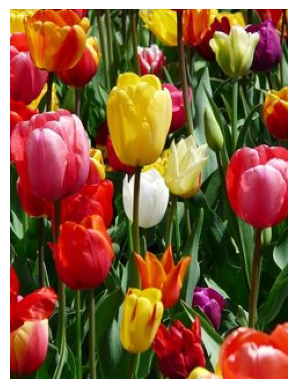

In [5]:
# Display the photo and its shape
print(img.shape)
plt.imshow(img)
plt.axis('off');

Aquí tenemos una fotografía de algunos tulipanes. La forma de la imagen es 320 x 240 x 3. Esto puede interpretarse como información de píxeles. Cada punto en tu pantalla es un píxel. Esta fotografía tiene 320 píxeles verticales y 240 píxeles horizontales.

Pero, ¿qué es la tercera dimensión de "3"? Esta dimensión se refiere a los valores que codifican el color de cada píxel. Cada píxel tiene 3 parámetros: rojo (R), verde (G) y azul (B), también conocidos como sus valores RGB. Para cada color—R, G y B—el valor codificado puede variar de 0 a 255. Esto significa que hay 256³, o 16,777,216 combinaciones diferentes de RGB, cada una resultando en un color único en tu pantalla.

Para preparar estos datos para el modelado, los reestructuraremos en un arreglo, donde cada fila representa los valores de color RGB de un solo píxel.


In [6]:
# Reshape the image so that each row represents a single pixel 
# defined by three values: R, G, B
img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
img_flat[:5, :]

array([[211, 197,  38],
       [199, 181,  21],
       [178, 154,   0],
       [185, 152,   0],
       [184, 145,   0]], dtype=uint8)

In [9]:
img_flat.shape

(76800, 3)

## Dibujar los datos en el espacio 3-D


Ahora tenemos un array que es 76,800 x 3. Cada fila son los valores de color de un solo píxel. Debido a que solo tenemos 3 columnas, podemos visualizar estos datos en un espacio tridimensional. Creemos un dataframe de pandas para ayudarnos a entender y visualizar nuestros datos.


In [7]:
# Create a pandas df with r, g, and b as columns
img_flat_df = pd.DataFrame(img_flat, columns = ['r', 'g', 'b'])
img_flat_df.head()

,r,g,b
0,211,197,38
1,199,181,21
2,178,154,0
3,185,152,0
4,184,145,0


**Nota:** La salida de la siguiente celda se puede ver de dos maneras: puedes volver a ejecutar esta celda, o convertir manualmente el cuaderno a "Confiable".


In [8]:
# Create 3D plot where each pixel in the `img` is displayed in its actual color
trace = go.Scatter3d(x = img_flat_df.r,
                     y = img_flat_df.g,
                     z = img_flat_df.b,
                     mode='markers',
                     marker=dict(size=1,
                                 color=['rgb({},{},{})'.format(r,g,b) for r,g,b 
                                        in zip(img_flat_df.r.values, 
                                               img_flat_df.g.values, 
                                               img_flat_df.b.values)],
                                 opacity=0.5))

data = [trace]

layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0),
                               )

fig = go.Figure(data=data, layout=layout)
fig.update_layout(scene = dict(
                    xaxis_title='R',
                    yaxis_title='G',
                    zaxis_title='B'),
                  )
fig.show()

En este gráfico, cada punto representa un color/píxel que está en nuestra imagen original de tulipanes. Cuanto más intenso sea el color, más puntos están concentrados en esa área. Los colores más representados en el gráfico son los colores más abundantes en la fotografía: principalmente rojos, verdes y amarillos. Puedes hacer clic y girar este gráfico para examinarlo desde diferentes ángulos. También puedes hacer zoom y alejar.

Podemos entrenar un modelo de K-medias en estos datos. El algoritmo creará _k_ grupos minimizando las distancias al cuadrado desde cada punto hasta su centroide más cercano.

Primero hagamos un experimento. ¿Qué esperarías que suceda si construimos un modelo de K-medias con solo un centroide (_k_ = 1) y reemplazamos cada píxel en la fotografía con el valor RGB de ese centroide? ¿Cómo se vería la fotografía?

Vamos a intentarlo.


## Agrupar los datos: _k_ = 1


In [9]:
# Instantiate the model
kmeans = KMeans(n_clusters=1, random_state=42).fit(img_flat)

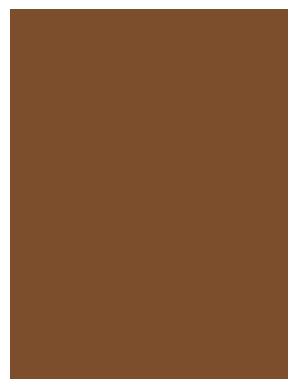

In [10]:
# Copy `img_flat` so we can modify it
img_flat1 = img_flat.copy()

# Replace each row in the original image with its closest cluster center
for i in np.unique(kmeans.labels_):
    img_flat1[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]

# Reshape the data back to (640, 480, 3)
img1 = img_flat1.reshape(img.shape)

plt.imshow(img1)
plt.axis('off');

Entonces, ¿qué pasó? Bueno, repasemos los pasos de K-means:

1. Colocamos aleatoriamente nuestro centroide en el espacio de colores.
2. Asignamos cada punto a su centroide más cercano. Dado que solo había un centroide, todos los puntos fueron asignados al mismo centroide, y por lo tanto al mismo grupo.
3. Actualizamos la ubicación del centroide a la ubicación media de todos sus puntos. Nuevamente, dado que solo hay un centroide, se actualizó a la ubicación media de cada punto en la imagen.
4. Repetir hasta que el modelo converja. En este caso, solo tomó una iteración para que el modelo convergiera.

Luego actualizamos los valores RGB de cada píxel para que sean iguales a los del centroide. El resultado es la imagen de nuestros tulipanes cuando cada píxel es reemplazado por el color promedio. El color promedio de esta foto era marrón⁠—todos los colores mezclados juntos.

Podemos verificar esto por nosotros mismos calculando manualmente el promedio de cada columna en el array aplanado. Esto nos dará el valor promedio de R, G y B.


In [11]:
# Calculate mean of each column in the flattened array
column_means = img_flat.mean(axis=0)

print('column means: ', column_means)

column means:  [125.60802083  78.90632813  43.45473958]


Ahora, podemos comparar esto con lo que el modelo K-means calculó como la ubicación final de su un centroide.


In [12]:
print('cluster centers: ', kmeans.cluster_centers_)

cluster centers:  [[125.60802083  78.90632813  43.45473958]]


¡Son iguales! Ahora, volvamos a la representación en 3D de nuestros datos, solo que esta vez agregaremos el centroide.

**Nota:** La salida de la siguiente celda se puede ver de dos maneras: puedes volver a ejecutar esta celda, o convertir manualmente el cuaderno a "Confiable".


In [13]:
# Create 3-D plot where each pixel in the `img` is displayed in its actual color
trace = go.Scatter3d(x = img_flat_df.r,
                     y = img_flat_df.g,
                     z = img_flat_df.b,
                     mode='markers',
                     marker=dict(size=1,
                                 color=['rgb({},{},{})'.format(r,g,b) for 
                                        r,g,b in zip(img_flat_df.r.values, 
                                                     img_flat_df.g.values, 
                                                     img_flat_df.b.values)],
                                 opacity=0.5))

data = [trace]

layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0))

fig = go.Figure(data=data, layout=layout)


# Add centroid to chart
centroid = kmeans.cluster_centers_[0].tolist()

fig.add_trace(
    go.Scatter3d(x = [centroid[0]],
                 y = [centroid[1]],
                 z = [centroid[2]],
                 mode='markers',
                 marker=dict(size=7,
                             color=['rgb(125.79706706,78.8178776,42.58090169)'],
                             opacity=1))
)
fig.update_layout(scene = dict(
                    xaxis_title='R',
                    yaxis_title='G',
                    zaxis_title='B'),
                  )
fig.show()

Podemos ver el centroide como un círculo grande en el medio del espacio de colores. (Si no puedes, simplemente haz clic en la imagen y gírala/aleja el zoom.) Observa que esto es el "centro de gravedad" de todos los puntos en el gráfico.

Ahora intentemos otra cosa. Volvamos a ajustar un modelo K-means a los datos, esta vez usando _k_ = 3. Tómate un momento para considerar qué podrías esperar que resulte de esto. Revisa los pasos de lo que hace el modelo como hicimos arriba. ¿Qué colores es probable que veas?


## Agrupar los datos: _k_ = 3


In [14]:
# Instantiate k-means model for 3 clusters
kmeans3 = KMeans(n_clusters=3, random_state=42).fit(img_flat)

# Check the unique values of what's returned by the .labels_ attribute 
np.unique(kmeans3.labels_)

array([0, 1, 2], dtype=int32)

El atributo `.cluster_centers_` devuelve un array donde cada elemento representa las coordenadas de un centroide (es decir, sus valores RGB). Usaremos estas coordenadas como hicimos anteriormente para generar los colores que están representados por nuestros centroides.


In [15]:
# Assign centroid coordinates to `centers` variable
centers = kmeans3.cluster_centers_
centers

array([[202.94809272, 174.18418712, 111.37454869],
       [ 41.26942958,  50.19883774,  15.9462609 ],
       [176.79647115,  43.60730575,  27.50588141]])

Ahora crearemos una función auxiliar para mostrar fácilmente los valores RGB como muestras de color, y la usaremos para verificar los colores de los centroides del modelo.


In [16]:
# Helper function that creates color swatches
def show_swatch(RGB_value):
    '''
    Takes in an RGB value and outputs a color swatch
    '''
    R, G, B = RGB_value
    rgb = [[np.array([R,G,B]).astype('uint8')]]
    plt.figure()
    plt.imshow(rgb)
    plt.axis('off');

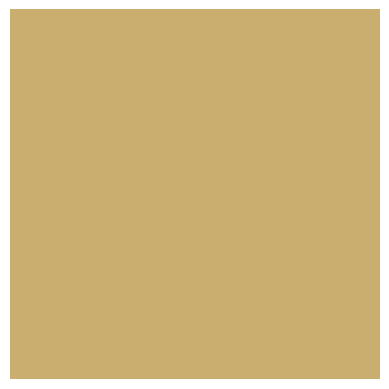

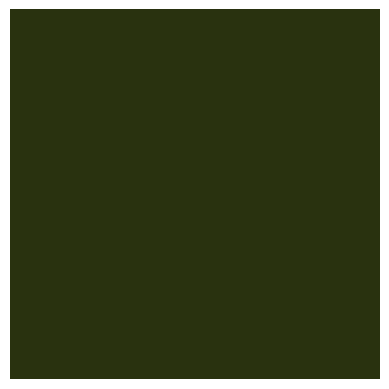

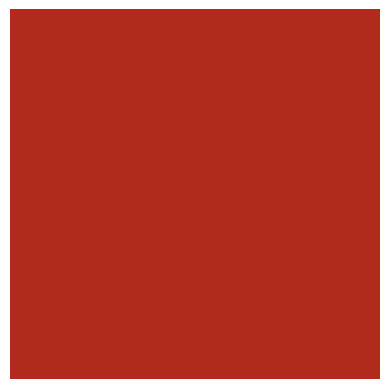

In [17]:
# Display the color swatches
for pixel in centers:
    show_swatch(pixel)

Con suerte, hipótesis que veríamos colores similares como resultado de un modelo de 3 clústeres. Si examinas la imagen original de los tulipanes, es evidente que hay generalmente tres colores dominantes: rojos, verdes y dorados/amarillos, lo cual está muy cerca de lo que devolvió el modelo.

Al igual que antes, ahora reemplazemos cada píxel en la imagen original con el valor RGB del centroide al que fue asignado.


In [18]:
# Helper function to display our photograph when clustered into k clusters
def cluster_image(k, img=img):
    """
    Fits a K-means model to a photograph.
    Replaces photo's pixels with RGB values of model's centroids.
    Displays the updated image.

    Args:
      k:    (int)          - Your selected K-value
      img:  (numpy array)  - Your original image converted to a numpy array

    Returns:
      The output of plt.imshow(new_img), where new_img is a new numpy array
      where each row of the original array has been replaced with the 
      coordinates of its nearest centroid.
    """

    img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
    kmeans = KMeans(n_clusters = k, random_state = 42).fit(img_flat)
    new_img = img_flat.copy()
  
    for i in np.unique(kmeans.labels_):
        new_img[kmeans.labels_ == i, :] = kmeans.cluster_centers_[i]
  
    new_img = new_img.reshape(img.shape)

    return plt.imshow(new_img), plt.axis('off');
  

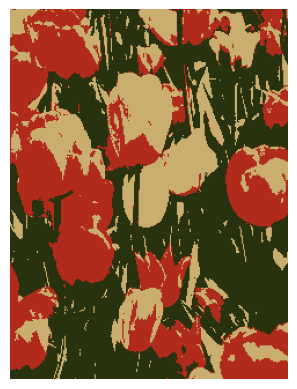

In [19]:
# Generate image when k=3
cluster_image(3);

Ahora tenemos una foto con solo tres colores. Los valores RGB de cada píxel corresponden a los valores de su centroide más cercano.

Podemos volver una vez más a nuestro espacio de colores en 3D. Esta vez, volveremos a colorear cada punto en el espacio de colores para que corresponda con el color de su centroide. Esto nos permitirá ver cómo el algoritmo K-means agrupó espacialmente nuestros datos.

De nuevo, no te preocupes tanto por el código. Siéntete libre de saltar hasta el gráfico.


In [20]:
# Just to get an understanding of what the data structures look like

print(kmeans3.labels_.shape)
print(kmeans3.labels_)
print(np.unique(kmeans3.labels_))
print(kmeans3.cluster_centers_)

(76800,)
[0 0 2 ... 2 2 2]
[0 1 2]
[[202.94809272 174.18418712 111.37454869]
 [ 41.26942958  50.19883774  15.9462609 ]
 [176.79647115  43.60730575  27.50588141]]


In [21]:
# Create a new column in the df that indicates the cluster number of each row 
# (as assigned by Kmeans for k=3)
img_flat_df['cluster'] = kmeans3.labels_
img_flat_df.head()

,r,g,b,cluster
0,211,197,38,0
1,199,181,21,0
2,178,154,0,2
3,185,152,0,2
4,184,145,0,2


In [22]:
# Create helper dictionary to map RGB color values to each observation in df
series_conversion = {0: 'rgb' +str(tuple(kmeans3.cluster_centers_[0])),
                     1: 'rgb' +str(tuple(kmeans3.cluster_centers_[1])),
                     2: 'rgb' +str(tuple(kmeans3.cluster_centers_[2])),
                     }
series_conversion

{0: 'rgb(np.float64(202.9480927214627), np.float64(174.18418711736348), np.float64(111.37454868924003))',
 1: 'rgb(np.float64(41.26942957637941), np.float64(50.19883774277176), np.float64(15.946260896161046))',
 2: 'rgb(np.float64(176.79647115307077), np.float64(43.60730575337908), np.float64(27.505881411537352))'}

In [23]:
# Replace the cluster numbers in the 'cluster' col with formatted RGB values 
# (made ready for plotting)
img_flat_df['cluster'] = img_flat_df['cluster'].map(series_conversion)
img_flat_df.head()

,r,g,b,cluster
0,211,197,38,"rgb(np.float64(202.9480927214627), np.float64(..."
1,199,181,21,"rgb(np.float64(202.9480927214627), np.float64(..."
2,178,154,0,"rgb(np.float64(176.79647115307077), np.float64..."
3,185,152,0,"rgb(np.float64(176.79647115307077), np.float64..."
4,184,145,0,"rgb(np.float64(176.79647115307077), np.float64..."


In [24]:
# Replot the data, now showing which cluster (i.e., color) it was assigned to by K-means when k=3

color=['rgb({},{},{})'.format(int(r), int(g), int(b)) 
       for r, g, b in zip(img_flat_df.r.values, 
                           img_flat_df.g.values, 
                           img_flat_df.b.values)]


trace = go.Scatter3d(x = img_flat_df.r,
                     y = img_flat_df.g,
                     z = img_flat_df.b,
                     mode='markers',
                     marker=dict(size=1,
                                 color=color,
                                 opacity=1))

data = trace

layout = go.Layout(margin=dict(l=0,
                               r=0,
                               b=0,
                               t=0))

fig = go.Figure(data=data, layout=layout)
fig.show()

Podrías estar pensando para ti mismo que habrías agrupado los datos de manera diferente basándote en la distribución de puntos que viste en la primera gráfica 3-D. Por ejemplo, ¿por qué hay una línea marcada que separa el rojo y el verde, cuando no parece haber ningún espacio vacío allí en los datos?

No estás equivocado. Aunque no existe algo como una agrupación "incorrecta", algunas formas definitivamente pueden ser mejores que otras.

Notarás en la representación original en 3-D que hay bandas largas—no bolas redondas—de datos agrupados. K-means funciona mejor cuando los grupos son más circulares, porque intenta minimizar la distancia desde el punto hasta el centroide. Podría valer la pena probar un algoritmo de agrupamiento diferente si quieres agrupar una banda larga, estrecha y continua de datos. (¡Más sobre esto más adelante!)

No obstante, K-means comprime con éxito los colores de esta fotografía. Este proceso puede aplicarse para cualquier valor de _k_. Aquí está la salida de cada foto para _k_ = 2–10.


In [25]:
import numpy as np
print(np.__version__)

2.4.2


## Agrupar los datos: _k_ = 2-10


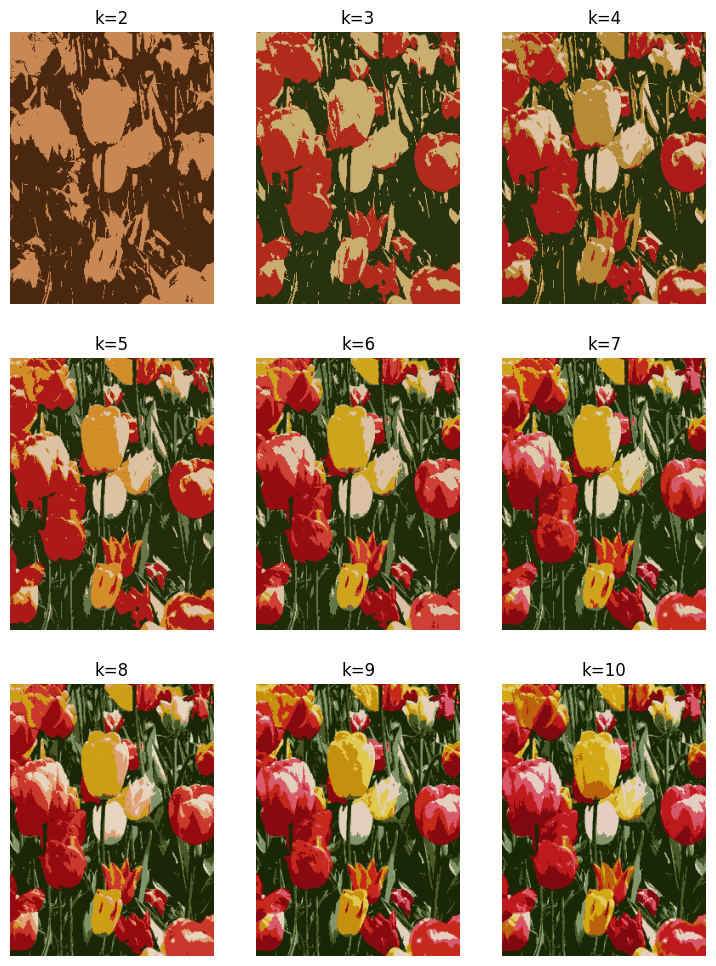

In [26]:
# Helper function to plot image grid
def cluster_image_grid(k, ax, img=img):
    '''
    Fits a K-means model to a photograph.
    Replaces photo's pixels with RGB values of model's centroids.
    Displays the updated image on an axis of a figure.

    Args:
      k:    (int)          - Your selected K-value
      ax:   (int)          - Index of the axis of the figure to plot to
      img:  (numpy array)  - Your original image converted to a numpy array

    Returns:
      A new image where each row of img's array has been replaced with the 
      coordinates of its nearest centroid. Image is assigned to an axis that
      can be used in an image grid figure.
    '''
    img_flat = img.reshape(img.shape[0]*img.shape[1], 3)
    kmeans = KMeans(n_clusters=k, random_state=42).fit(img_flat)
    new_img = img_flat.copy()

    for i in np.unique(kmeans.labels_):
        new_img[kmeans.labels_==i, :] = kmeans.cluster_centers_[i]

    new_img = new_img.reshape(img.shape)
    ax.imshow(new_img)
    ax.axis('off')

fig, axs = plt.subplots(3, 3)
fig = plt.gcf()
fig.set_size_inches(9, 12)
axs = axs.flatten()
k_values = np.arange(2, 11)
for i, k in enumerate(k_values):
    cluster_image_grid(k, axs[i], img=img)
    axs[i].title.set_text('k=' + str(k))

Notice que se vuelve cada vez más difícil ver la diferencia entre las imágenes cada vez que se añade un color. Este es un ejemplo visual de algo que sucede con todos los modelos de agrupamiento, incluso si los datos no son una imagen que puedas ver. A medida que agrupas los datos en más y más clusters, los clusters adicionales más allá de cierto punto contribuyen cada vez menos a tu comprensión de tus datos.

Con suerte, esta demostración ha profundizado tu comprensión de cómo funciona el algoritmo K-means. Pronto, exploraremos métodos para determinar numéricamente qué valor de _k_ es el mejor para datos particulares. Como siempre, siéntete libre de explorar más el cuaderno por tu cuenta para seguir desarrollando tu conjunto de habilidades!


**¡Felicidades!** Has completado este laboratorio. Sin embargo, es posible que no notes una marca de verificación verde junto a este elemento en la plataforma de Coursera. Por favor, continúa con tu progreso independientemente de la marca de verificación. Solo haz clic en el icono de "guardar" en la parte superior de este cuaderno para asegurarte de que tu trabajo haya sido registrado.
